In [311]:
!pip  install catboost

#Импорт библиотек


In [312]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from sklearn.metrics import roc_auc_score, roc_curve
import seaborn as sns
import matplotlib.pyplot as plt

#Первичный анализ


In [313]:
df = pd.read_csv('train.csv')
df.head()# загружаем данные  смотрим  первые  пять записей  и  делаем  первые  выводы о данных

<ipython-input-313-6dcaa522ac3a>:1: DtypeWarning: Columns (51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,131,132,133,135,136,139,140,141,142,143,144,145,146,147,148,149,151,152,155,156,157,158,159,160,161,163,164,165,167,168,169,171,172,173,174,175,176,177,178,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,223,224,227,239,240,241,242,243,244,245,246,459,460,461,467,468,469,515,516,523,524,531,532,539,540,547,548,555,556,563,564,565,567,571,572,573,575,579,580,581,582,583,587,588,595,596,603,604,611,612,613,615,795,796,797,799,1031,1032,1033,1034,1035,1036,1037,1039,1040,1041,1042,1043,1044,1045,1047,1048,1049,1050,1051,1052,1055,1056,1057,1058,1059,1060,1063,1064,1065,1067,1068,1069,1072,1073,1074,1075,1076,1077,1078,1172,1173,1174,1176,1177,1178,1179,1180,1181,1182,1275,1276,1277,1278,1279,1280,1281,1282,1447,1448,1449,1450,1451,1452,1453,1454,1649,1650

,report_date,client_id,target,col1,col2,col3,col4,col5,col6,col7,...,col2654,col2655,col2656,col2657,col2658,col2659,col2660,col2661,col2662,col2663
0,2022-11-01,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.256261
1,2022-11-01,5,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7616803.0,7616803.0,7616803.0,NaN,NaN,NaN,7616803.0,7616803.0,7616803.0,0.256261
2,2022-05-01,6,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.256261
3,2022-09-01,7,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.258682
4,2022-08-01,8,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.254164


In [314]:
def drop_columns_with_many_na(dataframe, threshold=0.45):
    # Проверяем количество пропущенных значений в каждом столбце
    na_counts = dataframe.isna().sum()

    # Удаляем столбцы, в которых количество пропусков больше порога
    dropped_columns = [column for column in na_counts.index if na_counts[column] > threshold * len(dataframe)]
    return dataframe.drop(dropped_columns, axis=1)

# Применяем функцию к нашему DataFrame
df = drop_columns_with_many_na(df)

In [315]:
df.shape# размерности  колонок , довольно  много  2666 и не знаем  какая конкретно  за что отвечает

(14456, 340)

In [316]:
df.select_dtypes(include=['category', 'object']) # смотрим  на категориальные  колонки

,report_date,col1454
0,2022-11-01,00f3d719-a6ec-4960-ba01-8372eb705443
1,2022-11-01,01febac0-b083-494e-8589-f98400074b94
2,2022-05-01,0278175e-c0bb-4e1e-bfe5-20db6811d3e2
3,2022-09-01,0364571d-5325-ed11-b823-005056b825cd
4,2022-08-01,065957a6-9b2a-435a-b561-024e9e8d9ad7
...,...,...
14451,2022-07-01,fc4b5aa0-c4d6-4394-93db-57a1505e66c4
14452,2022-09-01,fcc827d8-b64b-4b59-b718-87f2a51d77a4
14453,2022-02-01,fd5f22f5-36f6-4dca-9896-8c9e90bbb702
14454,2021-08-01,fdf04fb7-5404-4a9c-ae5b-e1e893060631


In [317]:
cat_columns = df.select_dtypes('object').columns
numeric_columns = df.select_dtypes(include=['float']).columns
df = df.drop_duplicates(subset=list(set(df.columns) - set(['report_date', 'target'])))

In [318]:
# Заполняем пропущенные значения в категориальных переменных
for cat_col in cat_columns:
    df[cat_col] = df[cat_col].fillna("unknown")

# Заполняем пропущенные значения в числовых переменных
for num_col in numeric_columns:
    mean_value = df[num_col].mean()
    df[num_col] = df[num_col].fillna(int(mean_value))

df = df.apply(lambda x:x.fillna(0))

<ipython-input-318-b89650fc7b7e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[cat_col] = df[cat_col].fillna("unknown")
<ipython-input-318-b89650fc7b7e>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[num_col] = df[num_col].fillna(int(mean_value))


In [319]:
df_cl = df[df['client_id'] == 51]

col1454 представялет собой  либо хеш либо специальны й номер  юзера  , который не  меняется и  эта колонка выполняе т ту же функцию . что и юзер  айди  если  её  перекодировать в понятные  дял моедли  цифры  , функция  будет такой же  как у колонки бзер  айди  , так что от этой колонки мы избавляемся

In [320]:
df_cl # у  одного  клиента  в разные  даты  могут быть разные  значения  таргет  колонки, поэтому выкидывать дату нельзя

,report_date,client_id,target,col1453,col1454,col1455,col1456,col1457,col1458,col1459,...,col2564,col2565,col2566,col2588,col2589,col2590,col2660,col2661,col2662,col2663
39,2022-08-01,51,1,0,215aa8e0-237e-4261-a38b-ec34957b37cb,0.0,0.0,1.0,1.0,1.0,...,6412289.0,6298885.0,6354174.0,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217
1482,2022-04-01,51,0,0,215aa8e0-237e-4261-a38b-ec34957b37cb,0.0,0.0,0.0,1.0,1.0,...,6412289.0,6298885.0,6354174.0,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217
1779,2022-09-01,51,1,0,215aa8e0-237e-4261-a38b-ec34957b37cb,0.0,0.0,0.0,1.0,1.0,...,6412289.0,6298885.0,6354174.0,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217
2676,2022-03-01,51,0,0,215aa8e0-237e-4261-a38b-ec34957b37cb,0.0,0.0,1.0,1.0,1.0,...,6412289.0,6298885.0,6354174.0,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217
6191,2021-12-01,51,0,0,215aa8e0-237e-4261-a38b-ec34957b37cb,0.0,0.0,0.0,0.0,0.0,...,6412289.0,6298885.0,6354174.0,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217
12729,2022-10-01,51,1,0,215aa8e0-237e-4261-a38b-ec34957b37cb,0.0,0.0,0.0,1.0,1.0,...,6412289.0,6298885.0,6354174.0,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217


In [321]:
df.drop('col1454' , axis = 1 , inplace = True)

In [322]:
df.shape

(14320, 339)

In [323]:
def most_frequent_in_each_column(df):
    # Создаем новый DataFrame, где в каждой колонке будет самое часто встречающееся значение
    frequent_values = df.apply(pd.Series.mode)

    # Если в колонке есть несколько наиболее часто встречающихся значений, выбираем первое
    frequent_values.replace(to_replace=pd.NA, value=None, inplace=True)

    # Выводим результат
    return frequent_values
result = most_frequent_in_each_column(df)
result

,report_date,client_id,target,col1453,col1455,col1456,col1457,col1458,col1459,col1460,...,col2564,col2565,col2566,col2588,col2589,col2590,col2660,col2661,col2662,col2663
0,2023-01-01,50,0,0,0.0,0.0,0.0,0.0,0.0,1.0,...,6412289.0,6298885.0,6354174.0,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.256261


In [324]:
def remove_constant_columns(df):
    # Проверяем, есть ли в столбце только одна уникальная строка
    constant_columns = [col for col in df.columns if df[col].nunique() == 1]

    # Удаляем эти столбцы
    return df.drop(columns=constant_columns)

In [325]:
df  = remove_constant_columns(df)

In [326]:
df.shape

(14320, 178)

# Разделение данных  и  обучение модели


так как  фичей  в датасете много даже после первичной обработки
 около  300 , у нас есть три  пути  , чтобы выделить  самые  главные  фичи  , которые  влияют больше всего  на  наш  таргет  
1: самый  простой возьмем  и  посмотрим  на  матрицу  корреляций  , но она  получиться  слишком большой и  явно не информативной  для такого кол-ва фичей
2: обучить дерево  или бустинг  и  с помощью  встроенных  методов  таких  моделей  посомтреть  важность  фичей  , что  уже  кажется  долгим  и  не совсем  правильным  ,  ибо  признаков много и  даже  если  выделить 10  самых  информативных  нужно  выделять границу  по который  мы будем отссеивать  колонки  например создать колонку  с  рандомными  значениями  и  все колонки , которые  влияют меньше  чем она удалить  , но  с таким  кол-вом  фичей  подход  кажется  примитивным
3:третий  способ , который мы  и  будем  использовать  понжение  размерности  TSNE PCA из  известных  можно  написать и  свою  реализацию  с  разложением  матрицы  на  менее размерную  , но  использувать будем  PCA он  выделит элементы  с  наибольше й диспресией  , которые и будут  больше всего влиять  на  таргет

так как несколько  записей  могут относиться  к  одним  люядм  надо , чтобы записи  по  1 пользователю находились либо в тесте  либо в трейне

In [327]:
# from sklearn.model_selection import KFold
# from sklearn.model_selection import train_test_split
# kf = KFold(n_splits=5, shuffle=True, random_state=42)
# for train_index, test_index in kf.split(df):
#     df_train, df_test = df.iloc[train_index], df.iloc[test_index]

In [328]:
df = df.sort_values(['client_id', 'report_date'])
df['prev_target'] = df.groupby('client_id')['target'].shift(1)
df['record_count'] = df.groupby('client_id').cumcount() + 1
df['report_date'] = pd.to_datetime(df['report_date'])
df['days_since_last_interaction'] = df['report_date'].diff().dt.days
df =df.fillna(0)

In [329]:
df[df['client_id' ] == 51]

,report_date,client_id,target,col1453,col1455,col1456,col1457,col1458,col1459,col1460,...,col2588,col2589,col2590,col2660,col2661,col2662,col2663,prev_target,record_count,days_since_last_interaction
6191,2021-12-01,51,0,0,0.0,0.0,0.0,0.0,0.0,1.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,0.0,1,-427.0
2676,2022-03-01,51,0,0,0.0,0.0,1.0,1.0,1.0,1.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,0.0,2,90.0
1482,2022-04-01,51,0,0,0.0,0.0,0.0,1.0,1.0,1.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,0.0,3,31.0
39,2022-08-01,51,1,0,0.0,0.0,1.0,1.0,1.0,2.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,0.0,4,122.0
1779,2022-09-01,51,1,0,0.0,0.0,0.0,1.0,1.0,2.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,1.0,5,31.0
12729,2022-10-01,51,1,0,0.0,0.0,0.0,1.0,1.0,2.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,1.0,6,30.0


In [330]:

df.isna().sum()

report_date                    0
client_id                      0
target                         0
col1453                        0
col1455                        0
                              ..
col2662                        0
col2663                        0
prev_target                    0
record_count                   0
days_since_last_interaction    0
Length: 181, dtype: int64

In [331]:
client_ids = df['client_id'].unique()

# Split the customer IDs into training and testing sets
train_ids, test_ids = train_test_split(client_ids, test_size=0.25, random_state=42)

# Create the training and testing datasets based on the customer IDs
train_data = df[df['client_id'].isin(train_ids)]
test_data = df[df['client_id'].isin(test_ids)]

# Print the sizes of the training and testing datasets
print(train_data['client_id'].nunique())
print(test_data['client_id'].nunique())
print("Training dataset size:", len(train_data))
print("Testing dataset size:", len(test_data))

3612
1205
Training dataset size: 10741
Testing dataset size: 3579


In [332]:
train_data[train_data['client_id' ] == 51] # разделяем  выборку

,report_date,client_id,target,col1453,col1455,col1456,col1457,col1458,col1459,col1460,...,col2588,col2589,col2590,col2660,col2661,col2662,col2663,prev_target,record_count,days_since_last_interaction
6191,2021-12-01,51,0,0,0.0,0.0,0.0,0.0,0.0,1.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,0.0,1,-427.0
2676,2022-03-01,51,0,0,0.0,0.0,1.0,1.0,1.0,1.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,0.0,2,90.0
1482,2022-04-01,51,0,0,0.0,0.0,0.0,1.0,1.0,1.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,0.0,3,31.0
39,2022-08-01,51,1,0,0.0,0.0,1.0,1.0,1.0,2.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,0.0,4,122.0
1779,2022-09-01,51,1,0,0.0,0.0,0.0,1.0,1.0,2.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,1.0,5,31.0
12729,2022-10-01,51,1,0,0.0,0.0,0.0,1.0,1.0,2.0,...,270.0,267.0,269.0,6942170.0,6813845.0,6876651.0,0.257217,1.0,6,30.0


In [333]:
test_data[test_data['client_id' ] == 51]

,report_date,client_id,target,col1453,col1455,col1456,col1457,col1458,col1459,col1460,...,col2588,col2589,col2590,col2660,col2661,col2662,col2663,prev_target,record_count,days_since_last_interaction


In [334]:
X_train = train_data.drop(['target' , 'report_date' ] , axis = 1)
y_train = train_data['target']

X_test = test_data.drop(['target' ,  'report_date'], axis = 1)
y_test = test_data['target']

# Стандартизация и PCA


Опыты  и  сравнение результатов  показали  , что ни один  из  данных  подходов  на этом датасете себя хорошо не показывает , даже стандартизация делает качество  модели хуже

In [335]:
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler() # централизуем  данные  , чтобы  лучше работал  PCA

In [336]:
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.transform(X_test)

In [337]:
# from sklearn.decomposition import PCA

In [338]:
# pca = PCA(n_components= 0.66)# количество  компонент  можно  менять но с этим кол-вом модель показала  себя лучше всего
# X_pca_train = pca.fit_transform(X_scaled_train)
# X_pca_val = pca.transform(X_scaled_val)
# X_pca_train = pd.DataFrame(X_pca_train)
# X_pca_val = pd.DataFrame(X_pca_val)
# X_pca_train

In [339]:
def plot_roc_auc(y_true, y_pred):
    fpr, tpr, _ = roc_curve(y_true=y_true, y_score=y_pred)
    roc_auc = roc_auc_score(y_true=y_true, y_score=y_pred)

    plt.figure(figsize=(10, 3))
    plt.plot(fpr, tpr, color='darkorange',
             lw=2, label='ROC curve (area = %0.4f)' % roc_auc, alpha=0.5)

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', alpha=0.5)

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True)
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title('Receiver operating characteristic', fontsize=16)
    plt.legend(loc="lower right", fontsize=12)
    plt.show()
    return roc_auc #функция  для отрисовки

# Борьба с дисбалансом  классов


In [340]:
# from imblearn.over_sampling import RandomOverSampler
# ros = RandomOverSampler()
# X_train, y_train = ros.fit_resample(X_train, y_train)

In [341]:
# from imblearn.under_sampling import RandomUnderSampler

# # Создание экземпляра RandomUnderSampler
# rus = RandomUnderSampler()

# # Применение уменьшения выборки к данным
# X_train, y_train = rus.fit_resample(X_train, y_train)

In [342]:
# from imblearn.over_sampling import SMOTE

# smote = SMOTE()
# X_train, y_train = smote.fit_resample(X_train, y_train)

In [343]:
# from imblearn.over_sampling import ADASYN

# adasyn = ADASYN()


# X_train, y_train = adasyn.fit_resample(X_train, y_train)

 ни один  из  видов семплинга  или  андер семплинга хорошо не отражается на  качсетве  модели , но и ничего не делать приводит  с  нулевому реколу  и  пресижену  на таргет  == 1 , останавливаемся на  изменении  важности каждого класса


In [344]:
from sklearn.utils.class_weight import compute_class_weight
# Расчет дисбалнса классов
classes = np.unique(y_train)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weights = dict(zip(classes, weights))
class_weights

{0: 0.51619569396386, 1: 15.93620178041543}

пытаемся  уровнять по  весу классы


In [345]:
model = CatBoostClassifier(eval_metric = "AUC", class_weights = class_weights
                         )
model.fit(X_train, y_train, eval_set=(X_test, y_test), plot=True, verbose=False) # обучаем  бустнг

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

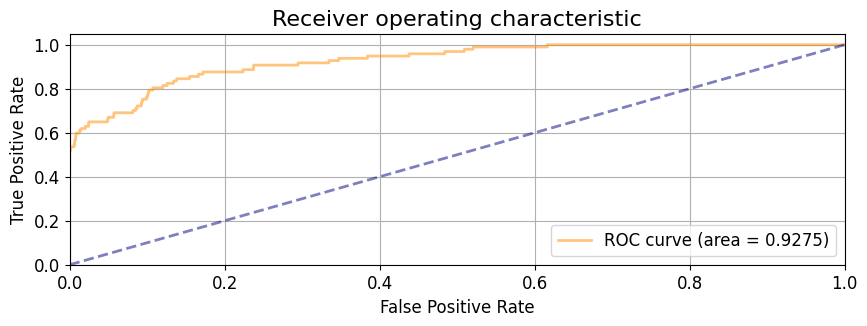

In [346]:
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, classification_report, precision_score, recall_score, f1_score
y_pred_proba = model.predict_proba(X_test)[:,1]
y_pred = model.predict(X_test)
# результаты  на  валидации
roc_auc = plot_roc_auc(y_true=y_test, y_pred=y_pred_proba)

In [347]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.96      0.98      3482
           1       0.34      0.65      0.45        97

    accuracy                           0.96      3579
   macro avg       0.67      0.81      0.71      3579
weighted avg       0.97      0.96      0.96      3579



In [348]:
fea_imp = model.get_feature_importance(prettified=True)

In [349]:
fea_imp

,Feature Id,Importances
0,prev_target,44.191426
1,col2663,5.219914
2,days_since_last_interaction,2.722896
3,col2340,2.600711
4,client_id,1.871095
...,...,...
174,col2497,0.000000
175,col2499,0.000000
176,col2500,0.000000
177,col2501,0.000000


In [350]:
fea_imp.describe()

,Importances
count,179.000000
mean,0.558659
std,3.326568
min,0.000000
25%,0.000009
50%,0.123446
75%,0.443543
max,44.191426


In [351]:
fea_imp = fea_imp[fea_imp['Importances'] > 0.443543]

In [352]:
fea_imp

,Feature Id,Importances
0,prev_target,44.191426
1,col2663,5.219914
2,days_since_last_interaction,2.722896
3,col2340,2.600711
4,client_id,1.871095
5,col2341,1.237688
6,col2590,1.185212
7,col2384,1.182924
8,col2318,1.165078
9,col2470,1.111013


In [353]:
data = df[fea_imp['Feature Id']]

In [354]:
data['client_id']  = df['client_id']
data['target']  =  df['target']

<ipython-input-354-9c641b54a0de>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['client_id']  = df['client_id']
<ipython-input-354-9c641b54a0de>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['target']  =  df['target']


In [355]:
data.columns

Index(['prev_target', 'col2663', 'days_since_last_interaction', 'col2340',
       'client_id', 'col2341', 'col2590', 'col2384', 'col2318', 'col2470',
       'col2414', 'col2311', 'col2589', 'col2412', 'col2456', 'col2317',
       'col2390', 'col2294', 'col2565', 'col1459', 'col2312', 'col2662',
       'col2342', 'col2310', 'col2382', 'col2455', 'col2383', 'col2389',
       'col2216', 'col2468', 'col2244', 'col2288', 'col1516', 'col2286',
       'col2287', 'col2220', 'col2360', 'col2334', 'col2221', 'col2173',
       'col2366', 'col2222', 'col2292', 'col2365', 'col2364', 'target'],
      dtype='object')

In [356]:
client_ids = data['client_id'].unique()

# Split the customer IDs into training and testing sets
train_ids, test_ids = train_test_split(client_ids, test_size=0.25, random_state=42)

# Create the training and testing datasets based on the customer IDs
train_data = data[data['client_id'].isin(train_ids)]
test_data = data[data['client_id'].isin(test_ids)]

# Print the sizes of the training and testing datasets
print(train_data['client_id'].nunique())
print(test_data['client_id'].nunique())
print("Training dataset size:", len(train_data))
print("Testing dataset size:", len(test_data))

3612
1205
Training dataset size: 10741
Testing dataset size: 3579


In [357]:
X_train = train_data.drop(['target' ] , axis = 1)
y_train = train_data['target']

X_test = test_data.drop(['target' ], axis = 1)
y_test = test_data['target']

# Результаты модели


сначала обучаем  модель со стандартными гиперпараметрами  

In [358]:
!pip install optuna

# Подбор гипер параметров

улучшить результат можно  2 способами  1 подбор гипер параметров 2 стекинг или беггинг  нескольких  моделей ,  мы будем  использовать первый , он  проще  и  предпочтителен  для  продукт задач

In [359]:
import optuna

In [364]:
def objective(trial):
  param = {
        'learning_rate' :trial.suggest_float('learning_rate' , 0.01 , 0.3),
        'objective': trial.suggest_categorical("objective", ["Logloss", "MultiClass", "MultiClassOneVsAll"]),
         'min_data_in_leaf' : trial.suggest_int('min_data_in_leaf' , 1 , 50),
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg' , 1, 11),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.9),
        "depth": trial.suggest_int("depth", 1, 12),
        "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]),
        "used_ram_limit": "8gb",
        }
  if param["bootstrap_type"] == "Bayesian":
      param["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
  elif param["bootstrap_type"] == "Bernoulli":
      param["subsample"] = trial.suggest_float("subsample", 0.1, 1)

  cat_cls = CatBoostClassifier(**param , class_weights = class_weights , iterations=2000 , early_stopping_rounds = 400 , eval_metric = "AUC" , random_state=42 )

  cat_cls.fit(X_train, y_train, eval_set=(X_test, y_test), plot=True, verbose=False )

  y_preds = cat_cls.predict(X_test)
  y_pred_proba = cat_cls.predict_proba(X_test)[:,1]
  roc_auc = roc_auc_score(y_true=y_test, y_score=y_pred_proba)
  return roc_auc



In [365]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)
print("Number of finished trials: {}".format(len(study.trials)))
print("Best trial:")
trial = study.best_trial
print("  Value: {}".format(trial.value))
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2024-04-06 14:42:54,885] A new study created in memory with name: no-name-0b0b2843-899e-4dc1-bb13-e320ab0527d8


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 14:43:14,637] Trial 0 finished with value: 0.9364759558732095 and parameters: {'learning_rate': 0.2314113281784359, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 29, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.7016228531667591, 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 14:47:13,362] Trial 1 finished with value: 0.9329541619048183 and parameters: {'learning_rate': 0.011602171250903508, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 34, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.6260383738746407, 'depth': 12, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7159909956042567}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:03:28,719] Trial 2 finished with value: 0.9288135743766174 and parameters: {'learning_rate': 0.23611150033902648, 'objective': 'MultiClass', 'min_data_in_leaf': 30, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.8141360567681094, 'depth': 11, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6167269806145775}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:03:33,383] Trial 3 finished with value: 0.9298483511668255 and parameters: {'learning_rate': 0.07438670011062659, 'objective': 'MultiClass', 'min_data_in_leaf': 46, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.4763952334013848, 'depth': 1, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 2.192527005875209}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:03:39,976] Trial 4 finished with value: 0.9102690123581069 and parameters: {'learning_rate': 0.07372023008339412, 'objective': 'Logloss', 'min_data_in_leaf': 37, 'l2_leaf_reg': 1, 'colsample_bylevel': 0.4387123534583301, 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:05:34,822] Trial 5 finished with value: 0.9205901336475659 and parameters: {'learning_rate': 0.26620284459947935, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 47, 'l2_leaf_reg': 3, 'colsample_bylevel': 0.7412009878655653, 'depth': 11, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:05:45,388] Trial 6 finished with value: 0.922986848416303 and parameters: {'learning_rate': 0.14396857527407111, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 35, 'l2_leaf_reg': 2, 'colsample_bylevel': 0.3213100740455102, 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.35051919736040027}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:05:56,192] Trial 7 finished with value: 0.9227307448616449 and parameters: {'learning_rate': 0.20560756006166722, 'objective': 'MultiClass', 'min_data_in_leaf': 7, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.01618001262140096, 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:08:22,664] Trial 8 finished with value: 0.9066732000213172 and parameters: {'learning_rate': 0.23569022039784412, 'objective': 'Logloss', 'min_data_in_leaf': 40, 'l2_leaf_reg': 3, 'colsample_bylevel': 0.7182762802416436, 'depth': 10, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 9.209483656129308}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:23:14,920] Trial 9 finished with value: 0.9308091095886355 and parameters: {'learning_rate': 0.05097429337228945, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 30, 'l2_leaf_reg': 2, 'colsample_bylevel': 0.31476861100429127, 'depth': 12, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:23:17,930] Trial 10 finished with value: 0.9271141126381922 and parameters: {'learning_rate': 0.16801958908299136, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 15, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.8840737119883566, 'depth': 4, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:23:37,797] Trial 11 finished with value: 0.929214753933336 and parameters: {'learning_rate': 0.12516455699343626, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 21, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.5938768947560702, 'depth': 9, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9671162027474598}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:23:41,304] Trial 12 finished with value: 0.9268150784298631 and parameters: {'learning_rate': 0.29732482719465003, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 23, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.5922078617306925, 'depth': 5, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7572903226377241}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:23:47,908] Trial 13 finished with value: 0.9357461347608023 and parameters: {'learning_rate': 0.018037237593561645, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 28, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.6100859340203945, 'depth': 3, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.11733283626722696}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:23:51,223] Trial 14 finished with value: 0.9363057136258934 and parameters: {'learning_rate': 0.18718769611264244, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 15, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.5003094305445105, 'depth': 2, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 7.809129087614028}. Best is trial 0 with value: 0.9364759558732095.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:23:53,854] Trial 15 finished with value: 0.9372265021287682 and parameters: {'learning_rate': 0.18723811180521693, 'objective': 'Logloss', 'min_data_in_leaf': 2, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.4400632871373438, 'depth': 1, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 7.85938890111278}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:23:58,163] Trial 16 finished with value: 0.9231541299288832 and parameters: {'learning_rate': 0.21744431400400185, 'objective': 'Logloss', 'min_data_in_leaf': 2, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.22261721312142912, 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 5.208718265516081}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:23:59,801] Trial 17 finished with value: 0.9276722111359155 and parameters: {'learning_rate': 0.10872245286154758, 'objective': 'Logloss', 'min_data_in_leaf': 16, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.15215503963205268, 'depth': 5, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 5.895678639016426}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:24:03,480] Trial 18 finished with value: 0.933615886118299 and parameters: {'learning_rate': 0.2755732617982972, 'objective': 'Logloss', 'min_data_in_leaf': 8, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.40754216923540326, 'depth': 1, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:25:30,236] Trial 19 finished with value: 0.9141623785358575 and parameters: {'learning_rate': 0.17463073389525358, 'objective': 'Logloss', 'min_data_in_leaf': 2, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.7264633467273637, 'depth': 9, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 0.6065013840108602}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:25:31,723] Trial 20 finished with value: 0.9309985966117351 and parameters: {'learning_rate': 0.24952066358610933, 'objective': 'Logloss', 'min_data_in_leaf': 19, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.36170800870728714, 'depth': 3, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:25:34,681] Trial 21 finished with value: 0.9304079300319168 and parameters: {'learning_rate': 0.19697196309933346, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 10, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.5015397429183224, 'depth': 2, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 8.707001939149421}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:25:36,749] Trial 22 finished with value: 0.9360984621943782 and parameters: {'learning_rate': 0.1892319493744297, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 12, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.5195239687811795, 'depth': 2, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 7.184990592910262}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:25:43,077] Trial 23 finished with value: 0.9352516920599017 and parameters: {'learning_rate': 0.15409607219446653, 'objective': 'MultiClass', 'min_data_in_leaf': 26, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.2470742563628389, 'depth': 1, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 7.159553534528957}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:25:45,689] Trial 24 finished with value: 0.9265974644267722 and parameters: {'learning_rate': 0.21853239038942654, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 5, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.6731891448858247, 'depth': 3, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 9.829313053965466}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:25:49,012] Trial 25 finished with value: 0.9247914162378535 and parameters: {'learning_rate': 0.1830620125818265, 'objective': 'Logloss', 'min_data_in_leaf': 14, 'l2_leaf_reg': 4, 'colsample_bylevel': 0.5241895806293211, 'depth': 6, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 7.62853666244107}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:26:06,991] Trial 26 finished with value: 0.930748414526549 and parameters: {'learning_rate': 0.1443648000030862, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 18, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.8615454743745191, 'depth': 4, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 3.4916896598802}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:26:08,559] Trial 27 finished with value: 0.9333509003594332 and parameters: {'learning_rate': 0.25227135245014465, 'objective': 'MultiClassOneVsAll', 'min_data_in_leaf': 24, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.41166117401222535, 'depth': 2, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:26:30,093] Trial 28 finished with value: 0.9371361997193223 and parameters: {'learning_rate': 0.12465521597724478, 'objective': 'MultiClass', 'min_data_in_leaf': 42, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.7781406687602883, 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 6.221952597644814}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:26:51,267] Trial 29 finished with value: 0.9294175642627475 and parameters: {'learning_rate': 0.12079217367052578, 'objective': 'MultiClass', 'min_data_in_leaf': 43, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.8013526135841594, 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 15 with value: 0.9372265021287682.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:27:12,981] Trial 30 finished with value: 0.9377061411559893 and parameters: {'learning_rate': 0.10748232953995447, 'objective': 'MultiClass', 'min_data_in_leaf': 49, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.7815246825269824, 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 3.9872542308196173}. Best is trial 30 with value: 0.9377061411559893.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:27:37,737] Trial 31 finished with value: 0.9328061251680217 and parameters: {'learning_rate': 0.100701598191555, 'objective': 'MultiClass', 'min_data_in_leaf': 50, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.7914733251454026, 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 4.156657916925962}. Best is trial 30 with value: 0.9377061411559893.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:28:02,389] Trial 32 finished with value: 0.9353790036535465 and parameters: {'learning_rate': 0.08979956788081819, 'objective': 'MultiClass', 'min_data_in_leaf': 40, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.6871401029696291, 'depth': 9, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 5.863468872683763}. Best is trial 30 with value: 0.9377061411559893.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:28:48,773] Trial 33 finished with value: 0.9272162579865819 and parameters: {'learning_rate': 0.162699864475182, 'objective': 'MultiClass', 'min_data_in_leaf': 33, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.8319651039249937, 'depth': 10, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 3.297940233178262}. Best is trial 30 with value: 0.9377061411559893.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:29:02,407] Trial 34 finished with value: 0.9440672797361392 and parameters: {'learning_rate': 0.1284134287326037, 'objective': 'MultiClass', 'min_data_in_leaf': 50, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.7760782000442178, 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 6.14025008047553}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:29:17,256] Trial 35 finished with value: 0.9309823125706875 and parameters: {'learning_rate': 0.13728102518248442, 'objective': 'MultiClass', 'min_data_in_leaf': 48, 'l2_leaf_reg': 4, 'colsample_bylevel': 0.76775256579084, 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 6.279167969913759}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:29:26,047] Trial 36 finished with value: 0.9348490321358147 and parameters: {'learning_rate': 0.06474025200221015, 'objective': 'MultiClass', 'min_data_in_leaf': 50, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.6509773144905069, 'depth': 6, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 4.523509547855386}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:30:16,792] Trial 37 finished with value: 0.9306729157907826 and parameters: {'learning_rate': 0.1205712499827424, 'objective': 'MultiClass', 'min_data_in_leaf': 44, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.8456332141193172, 'depth': 7, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 6.394620388323412}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:30:52,137] Trial 38 finished with value: 0.9338631074687495 and parameters: {'learning_rate': 0.09180985492957885, 'objective': 'MultiClass', 'min_data_in_leaf': 44, 'l2_leaf_reg': 4, 'colsample_bylevel': 0.5513208178876011, 'depth': 10, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 5.062627100229876}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:31:17,991] Trial 39 finished with value: 0.9331599329689656 and parameters: {'learning_rate': 0.04289635614784702, 'objective': 'MultiClass', 'min_data_in_leaf': 48, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.7565999858136083, 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 8.196186062534949}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:31:41,173] Trial 40 finished with value: 0.9267603048372485 and parameters: {'learning_rate': 0.13672090277346308, 'objective': 'MultiClass', 'min_data_in_leaf': 45, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.6428021993015681, 'depth': 5, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 6.710799455198759}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:32:01,773] Trial 41 finished with value: 0.9199698597203882 and parameters: {'learning_rate': 0.21587730244907247, 'objective': 'MultiClass', 'min_data_in_leaf': 40, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.7236249978162544, 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:32:33,684] Trial 42 finished with value: 0.9318971796040905 and parameters: {'learning_rate': 0.07846364344844266, 'objective': 'MultiClass', 'min_data_in_leaf': 32, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.8916340728151813, 'depth': 9, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.36300137330012344}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:32:40,568] Trial 43 finished with value: 0.9238513829591952 and parameters: {'learning_rate': 0.11112814381469768, 'objective': 'Logloss', 'min_data_in_leaf': 36, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.8035608119950947, 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:33:35,182] Trial 44 finished with value: 0.9314856374757959 and parameters: {'learning_rate': 0.15625257890678274, 'objective': 'MultiClass', 'min_data_in_leaf': 38, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.4543583581945542, 'depth': 11, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 2.284268402779955}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:33:53,575] Trial 45 finished with value: 0.9318720133588351 and parameters: {'learning_rate': 0.2333863660439277, 'objective': 'MultiClass', 'min_data_in_leaf': 47, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.6899325265701468, 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9840908175938996}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:34:10,640] Trial 46 finished with value: 0.9187278314986648 and parameters: {'learning_rate': 0.175028903968829, 'objective': 'Logloss', 'min_data_in_leaf': 42, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.5602315370899755, 'depth': 9, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:34:39,142] Trial 47 finished with value: 0.9300245148836135 and parameters: {'learning_rate': 0.2019835054885949, 'objective': 'MultiClass', 'min_data_in_leaf': 29, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.7788296421580463, 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 5.453168453585018}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:34:40,781] Trial 48 finished with value: 0.9215804994167353 and parameters: {'learning_rate': 0.13351304099566927, 'objective': 'Logloss', 'min_data_in_leaf': 50, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.025428639678346743, 'depth': 10, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.10972016157864584}. Best is trial 34 with value: 0.9440672797361392.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

[I 2024-04-06 15:34:51,070] Trial 49 finished with value: 0.9298779585141849 and parameters: {'learning_rate': 0.15246729826964575, 'objective': 'MultiClass', 'min_data_in_leaf': 38, 'l2_leaf_reg': 1, 'colsample_bylevel': 0.620827991568641, 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 3.776978001234044}. Best is trial 34 with value: 0.9440672797361392.


Number of finished trials: 50
Best trial:
  Value: 0.9440672797361392
  Params: 
    learning_rate: 0.1284134287326037
    objective: MultiClass
    min_data_in_leaf: 50
    l2_leaf_reg: 6
    colsample_bylevel: 0.7760782000442178
    depth: 7
    boosting_type: Plain
    bootstrap_type: Bayesian
    bagging_temperature: 6.14025008047553


# Результаты после  подбора


In [366]:
model = CatBoostClassifier(eval_metric = "AUC", learning_rate = 0.1284134287326037, l2_leaf_reg = 6 ,  class_weights = class_weights,
                           early_stopping_rounds = 400 , boosting_type = 'Plain' , depth = 7, iterations=5000,bootstrap_type= 'Bayesian', bagging_temperature = 6.14025008047553 ,
                         colsample_bylevel =  0.7760782000442178 , min_data_in_leaf =50, random_state=42  ,   objective = 'MultiClass'
                         )
model.fit(X_train, y_train, eval_set=(X_test, y_test), plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

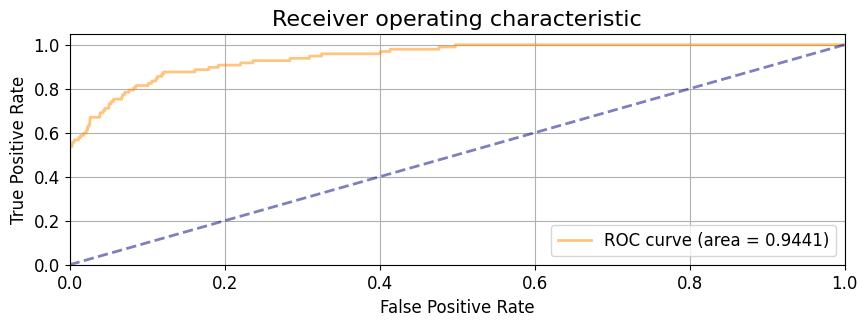

In [367]:
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, classification_report, precision_score, recall_score, f1_score
y_pred_proba = model.predict_proba(X_test)[:,1]
y_pred = model.predict(X_test)
# результаты  на  валидации
roc_auc = plot_roc_auc(y_true=y_test, y_pred=y_pred_proba)

In [368]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      3482
           1       0.36      0.67      0.47        97

    accuracy                           0.96      3579
   macro avg       0.67      0.82      0.72      3579
weighted avg       0.97      0.96      0.96      3579



In [369]:
fea_imp = model.get_feature_importance(prettified=True)
fea_imp

,Feature Id,Importances
0,prev_target,44.743456
1,col2663,9.806879
2,days_since_last_interaction,4.469154
3,client_id,2.648526
4,col2455,2.493221
5,col2470,2.335380
6,col2565,2.222139
7,col2340,1.859244
8,col2222,1.783628
9,col2390,1.765983


#submittion


In [370]:
X_val_df = pd.read_csv('valid.csv' , low_memory=False)

<Axes: >

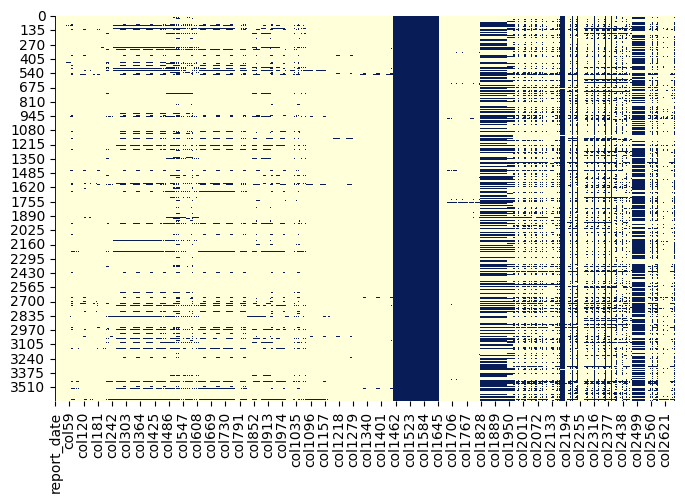

In [371]:
plt.figure(figsize = (8,5))
sns.heatmap(X_val_df.isnull(),cmap="YlGnBu_r",cbar=False)

In [372]:
X_val_df

,report_date,client_id,target,col1,col2,col3,col4,col5,col6,col7,...,col2654,col2655,col2656,col2657,col2658,col2659,col2660,col2661,col2662,col2663
0,2023-04-01,2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4941670.0,4941670.0,4941670.0,NaN,NaN,NaN,4941670.0,4941670.0,4941670.0,0.256919
1,2023-05-01,4,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,11789500.0,11789500.0,11789500.0,NaN,NaN,NaN,11789500.0,11789500.0,11789500.0,0.267221
2,2023-05-01,9,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7000000.0,7000000.0,7000000.0,NaN,NaN,NaN,7000000.0,7000000.0,7000000.0,0.257217
3,2023-03-01,12,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.256261
4,2023-03-01,14,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,10391000.0,10391000.0,10391000.0,0.257348
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3637,2023-04-01,4366,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,3500000.0,3500000.0,3500000.0,0.256261
3638,2023-04-01,8298,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.256261
3639,2023-03-01,835,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.256919
3640,2023-03-01,8300,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.257217


In [373]:
for cat_col in cat_columns:
    X_val_df[cat_col] =X_val_df[cat_col].fillna("unknown")

# Заполняем пропущенные значения в числовых переменных
for num_col in numeric_columns:
    mean_value = X_val_df[num_col].mean()
    X_val_df[num_col] = X_val_df[num_col].fillna(int(mean_value))

X_val_df = X_val_df.apply(lambda x:x.fillna(0))

In [374]:
X_val_df = X_val_df.sort_values(['client_id', 'report_date'])
X_val_df['prev_target'] = X_val_df.groupby('client_id')['target'].shift(1)
X_val_df['record_count'] = X_val_df.groupby('client_id').cumcount() + 1
X_val_df['report_date'] = pd.to_datetime(X_val_df['report_date'])
X_val_df['days_since_last_interaction'] = X_val_df['report_date'].diff().dt.days
X_val_df =X_val_df.fillna(0)
y_val = X_val_df['target']

In [375]:
X_val_df = X_val_df[X_train.columns]
X_val_df.shape

(3642, 45)

In [376]:
X_val_df[X_val_df['client_id'] ==2]

,prev_target,col2663,days_since_last_interaction,col2340,client_id,col2341,col2590,col2384,col2318,col2470,...,col2220,col2360,col2334,col2221,col2173,col2366,col2222,col2292,col2365,col2364
2326,0.0,0.256919,0.0,5794341.03,2,5794341.03,240.0,30.09,192567.0,271.0,...,6564363.2,1.0,5794341.03,10000.0,0.0,1.0,2.198121e+06,5.0,1.0,1.0
0,0.0,0.256919,31.0,5794341.03,2,5794341.03,240.0,30.09,192567.0,299.0,...,6564363.2,1.0,5794341.03,10000.0,0.0,1.0,2.198121e+06,5.0,1.0,1.0


In [ ]:
# X_val_df = scaler.transform(X_val_df)

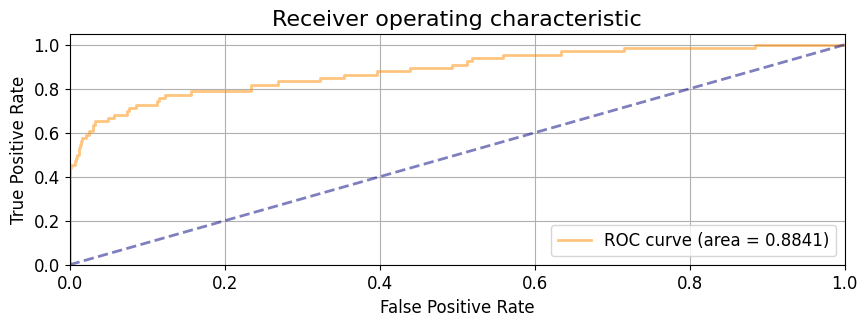

In [377]:
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, classification_report, precision_score, recall_score, f1_score
y_pred_proba = model.predict_proba(X_val_df)[:,1]
y_pred = model.predict(X_val_df)
# результаты  на  валидации
roc_auc = plot_roc_auc(y_true=y_val, y_pred=y_pred_proba)

In [378]:
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      3576
           1       0.28      0.62      0.38        66

    accuracy                           0.96      3642
   macro avg       0.63      0.80      0.68      3642
weighted avg       0.98      0.96      0.97      3642



In [379]:
submit_proba_predictions = model.predict_proba(X_val_df)

In [380]:
X_val_df['target'] = submit_proba_predictions[:,1]

In [381]:
X_val_df[['target']].reset_index().rename(columns={'index':'id'}).set_index('id').to_csv('submission_file2.csv', sep=';')